# Churn em Marketing

O **churn** refere-se à taxa de perda de clientes que deixam de fazer negócios com uma empresa. É um indicador importante, pois:

- **Impacto na Receita**: Quanto mais clientes cancelam seus serviços, maior a perda de receita.
- **Indicador de Satisfação**: Pode sinalizar insatisfação dos clientes em relação aos produtos ou serviços oferecidos.

## Estratégias para Reduzir o Churn

As empresas buscam diversas estratégias para reduzir o churn, incluindo:

- **Melhoria da Qualidade**: Aumentar a qualidade dos produtos e serviços oferecidos.
- **Suporte ao Cliente**: Oferecer suporte de qualidade e mais rápido.
- **Programas de Fidelidade**: Criar programas que incentivem a lealdade dos clientes.

Manter os clientes satisfeitos é fundamental para aumentar a retenção e a receita da empresa.

In [282]:
import pandas as pd
import requests

In [283]:


url = 'https://cdn3.gnarususercontent.com.br/2929-pandas/dataset-telecon.json'

try:
    response = requests.get(url)
    response.raise_for_status()  # Garante que a requisição foi bem-sucedida
    data = response.json()  # Converte a resposta JSON para um dicionário/lista
    df_churn = pd.DataFrame(data)  # Converte para DataFrame
    print(df_churn.head())
except Exception as e:
    print(f"Ocorreu um erro: {e}")


   id_cliente Churn                                            cliente  \
0  0002-ORFBO   nao  {'genero': 'feminino', 'idoso': 0, 'parceiro':...   
1  0003-MKNFE   nao  {'genero': 'masculino', 'idoso': 0, 'parceiro'...   
2  0004-TLHLJ   sim  {'genero': 'masculino', 'idoso': 0, 'parceiro'...   
3  0011-IGKFF   sim  {'genero': 'masculino', 'idoso': 1, 'parceiro'...   
4  0013-EXCHZ   sim  {'genero': 'feminino', 'idoso': 1, 'parceiro':...   

                                            telefone  \
0  {'servico_telefone': 'sim', 'varias_linhas': '...   
1  {'servico_telefone': 'sim', 'varias_linhas': '...   
2  {'servico_telefone': 'sim', 'varias_linhas': '...   
3  {'servico_telefone': 'sim', 'varias_linhas': '...   
4  {'servico_telefone': 'sim', 'varias_linhas': '...   

                                            internet  \
0  {'servico_internet': 'DSL', 'seguranca_online'...   
1  {'servico_internet': 'DSL', 'seguranca_online'...   
2  {'servico_internet': 'fibra otica', 'seguranca.

In [284]:
df_churn

,id_cliente,Churn,cliente,telefone,internet,conta
0,0002-ORFBO,nao,"{'genero': 'feminino', 'idoso': 0, 'parceiro':...","{'servico_telefone': 'sim', 'varias_linhas': '...","{'servico_internet': 'DSL', 'seguranca_online'...","{'contrato': None, 'faturamente_eletronico': N..."
1,0003-MKNFE,nao,"{'genero': 'masculino', 'idoso': 0, 'parceiro'...","{'servico_telefone': 'sim', 'varias_linhas': '...","{'servico_internet': 'DSL', 'seguranca_online'...","{'contrato': 'mes a mes', 'faturamente_eletron..."
2,0004-TLHLJ,sim,"{'genero': 'masculino', 'idoso': 0, 'parceiro'...","{'servico_telefone': 'sim', 'varias_linhas': '...","{'servico_internet': 'fibra otica', 'seguranca...","{'contrato': 'mes a mes', 'faturamente_eletron..."
3,0011-IGKFF,sim,"{'genero': 'masculino', 'idoso': 1, 'parceiro'...","{'servico_telefone': 'sim', 'varias_linhas': '...","{'servico_internet': 'fibra otica', 'seguranca...","{'contrato': 'mes a mes', 'faturamente_eletron..."
4,0013-EXCHZ,sim,"{'genero': 'feminino', 'idoso': 1, 'parceiro':...","{'servico_telefone': 'sim', 'varias_linhas': '...","{'servico_internet': 'fibra otica', 'seguranca...","{'contrato': 'mes a mes', 'faturamente_eletron..."
...,...,...,...,...,...,...
7339,5172-RKOCB,nao,"{'genero': 'masculino', 'idoso': 0, 'parceiro'...","{'servico_telefone': 'sim', 'varias_linhas': '...","{'servico_internet': 'fibra otica', 'seguranca...","{'contrato': 'dois anos', 'faturamente_eletron..."
7340,1934-MKPXS,nao,"{'genero': 'masculino', 'idoso': 0, 'parceiro'...","{'servico_telefone': 'sim', 'varias_linhas': '...","{'servico_internet': 'nao', 'seguranca_online'...","{'contrato': 'um ano', 'faturamente_eletronico..."
7341,5959-BELXA,sim,"{'genero': 'masculino', 'idoso': 1, 'parceiro'...","{'servico_telefone': 'sim', 'varias_linhas': '...","{'servico_internet': 'fibra otica', 'seguranca...","{'contrato': 'mes a mes', 'faturamente_eletron..."
7342,3601-UTZXO,,"{'genero': 'masculino', 'idoso': 0, 'parceiro'...","{'servico_telefone': 'sim', 'varias_linhas': '...","{'servico_internet': 'nao', 'seguranca_online'...","{'contrato': 'um ano', 'faturamente_eletronico..."


In [285]:
df_churn['conta'][0]

{'contrato': None,
 'faturamente_eletronico': None,
 'metodo_pagamento': None,
 'cobranca': {'mensal': None, 'Total': None}}

In [286]:
pd.json_normalize(df_churn['conta'][0])

,contrato,faturamente_eletronico,metodo_pagamento,cobranca.mensal,cobranca.Total
0,None,None,None,None,None


In [287]:
pd.json_normalize(df_churn['telefone'][0])

,servico_telefone,varias_linhas
0,sim,nao


Transformando dados em Tabela 

In [288]:
import requests
import json

url = "https://cdn3.gnarususercontent.com.br/2929-pandas/dataset-telecon.json"

try:
    # Faz o request para obter o JSON
    response = requests.get(url)
    response.raise_for_status()  # Verifica se houve erro na requisição
    
    # Converte a resposta para um objeto JSON (dicionário ou lista)
    json_bruto = response.json()
    
    # Se precisar visualizar a estrutura do JSON antes de normalizar:
    print(json.dumps(json_bruto, indent=2))  
    
    # Normaliza se for necessário
    df_churn = pd.json_normalize(json_bruto)

    print(df_churn.head())
    
except Exception as e:
    print(f"Ocorreu um erro: {e}")


[
  {
    "id_cliente": "0002-ORFBO",
    "Churn": "nao",
    "cliente": {
      "genero": "feminino",
      "idoso": 0,
      "parceiro": "sim",
      "dependentes": "sim",
      "tempo_servico": 9
    },
    "telefone": {
      "servico_telefone": "sim",
      "varias_linhas": "nao"
    },
    "internet": {
      "servico_internet": "DSL",
      "seguranca_online": "nao",
      "backup_online": "sim",
      "protecao_dispositivo": "nao",
      "suporte_tecnico": "sim",
      "tv_streaming": "sim",
      "filmes_streaming": "nao"
    },
    "conta": {
      "contrato": null,
      "faturamente_eletronico": null,
      "metodo_pagamento": null,
      "cobranca": {
        "mensal": null,
        "Total": null
      }
    }
  },
  {
    "id_cliente": "0003-MKNFE",
    "Churn": "nao",
    "cliente": {
      "genero": "masculino",
      "idoso": 0,
      "parceiro": "nao",
      "dependentes": "nao",
      "tempo_servico": 9
    },
    "telefone": {
      "servico_telefone": "sim",
      

In [289]:
df_churn.head()


,id_cliente,Churn,cliente.genero,cliente.idoso,cliente.parceiro,cliente.dependentes,cliente.tempo_servico,telefone.servico_telefone,telefone.varias_linhas,internet.servico_internet,...,internet.backup_online,internet.protecao_dispositivo,internet.suporte_tecnico,internet.tv_streaming,internet.filmes_streaming,conta.contrato,conta.faturamente_eletronico,conta.metodo_pagamento,conta.cobranca.mensal,conta.cobranca.Total
0,0002-ORFBO,nao,feminino,0,sim,sim,9.0,sim,nao,DSL,...,sim,nao,sim,sim,nao,None,None,None,NaN,None
1,0003-MKNFE,nao,masculino,0,nao,nao,9.0,sim,sim,DSL,...,nao,nao,nao,nao,sim,mes a mes,nao,cheque pelo correio,59.9,542.4
2,0004-TLHLJ,sim,masculino,0,nao,nao,4.0,sim,nao,fibra otica,...,nao,sim,nao,nao,nao,mes a mes,sim,cheque eletronico,73.9,280.85
3,0011-IGKFF,sim,masculino,1,sim,nao,13.0,sim,nao,fibra otica,...,sim,sim,nao,sim,sim,mes a mes,sim,cheque eletronico,98.0,1237.85
4,0013-EXCHZ,sim,feminino,1,sim,nao,3.0,sim,nao,fibra otica,...,nao,nao,sim,sim,nao,mes a mes,sim,cheque pelo correio,83.9,267.4


# Dicionário de Dados

| Coluna                           | Descrição                                           |
|----------------------------------|-----------------------------------------------------|
| id_cliente                       | Identificador único do cliente                       |
| Churn                            | Indica se o cliente cancelou o serviço (sim/não)   |
| cliente.genero                   | Gênero do cliente (masculino/feminino)             |
| cliente.idoso                    | Indica se o cliente é idoso (0 = não, 1 = sim)     |
| cliente.parceiro                 | Indica se o cliente tem parceiro (sim/não)          |
| cliente.dependentes              | Indica se o cliente tem dependentes (sim/não)      |
| cliente.tempo_servico            | Tempo de serviço em meses                           |
| telefone.servico_telefone        | Indica se o cliente possui serviço de telefone (sim/não) |
| telefone.varias_linhas           | Indica se o cliente possui várias linhas telefônicas (sim/não) |
| internet.servico_internet        | Tipo de serviço de internet (DSL, fibra ótica, etc.) |
| internet.backup_online           | Indica se o cliente possui backup online (sim/não)  |
| internet.protecao_dispositivo    | Indica se o cliente possui proteção de dispositivo (sim/não) |
| internet.suporte_tecnico         | Indica se o cliente possui suporte técnico (sim/não) |
| internet.tv_streaming            | Indica se o cliente possui serviço de TV streaming (sim/não) |
| internet.filmes_streaming        | Indica se o cliente possui serviço de filmes streaming (sim/não) |
| conta.contrato                   | Tipo de contrato (mensal, anual, etc.)              |
| conta.faturamente_eletronico     | Indica se o cliente utiliza faturamento eletrônico (sim/não) |
| conta.metodo_pagamento           | Método de pagamento utilizado (cheque, cartão, etc.) |
| conta.cobranca.mensal            | Valor da cobrança mensal em reais                   |
| conta.cobranca.Total             | Valor total gasto pelo cliente em reais             |

In [290]:
df_churn.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7344 entries, 0 to 7343
Data columns (total 21 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   id_cliente                     7344 non-null   object 
 1   Churn                          7344 non-null   object 
 2   cliente.genero                 7344 non-null   object 
 3   cliente.idoso                  7344 non-null   int64  
 4   cliente.parceiro               7344 non-null   object 
 5   cliente.dependentes            7344 non-null   object 
 6   cliente.tempo_servico          7336 non-null   float64
 7   telefone.servico_telefone      7344 non-null   object 
 8   telefone.varias_linhas         7344 non-null   object 
 9   internet.servico_internet      7344 non-null   object 
 10  internet.seguranca_online      7344 non-null   object 
 11  internet.backup_online         7344 non-null   object 
 12  internet.protecao_dispositivo  7344 non-null   o

In [291]:
df_churn[df_churn['conta.cobranca.Total'] == ' '].head() 

,id_cliente,Churn,cliente.genero,cliente.idoso,cliente.parceiro,cliente.dependentes,cliente.tempo_servico,telefone.servico_telefone,telefone.varias_linhas,internet.servico_internet,...,internet.backup_online,internet.protecao_dispositivo,internet.suporte_tecnico,internet.tv_streaming,internet.filmes_streaming,conta.contrato,conta.faturamente_eletronico,conta.metodo_pagamento,conta.cobranca.mensal,conta.cobranca.Total
975,1371-DWPAZ,nao,feminino,0,sim,sim,0.0,nao,sem servico de telefone,DSL,...,sim,sim,sim,sim,nao,dois anos,nao,cartao de credito (automatico),56.05,
1775,2520-SGTTA,nao,feminino,0,sim,sim,0.0,sim,nao,nao,...,sem servico de internet,sem servico de internet,sem servico de internet,sem servico de internet,sem servico de internet,dois anos,nao,cheque pelo correio,20.00,
1955,2775-SEFEE,nao,masculino,0,nao,sim,0.0,sim,sim,DSL,...,sim,nao,sim,nao,nao,dois anos,sim,transferencia bancaria (automatica),61.90,
2075,2923-ARZLG,nao,masculino,0,sim,sim,0.0,sim,nao,nao,...,sem servico de internet,sem servico de internet,sem servico de internet,sem servico de internet,sem servico de internet,dois anos,sim,cheque pelo correio,19.70,
2232,3115-CZMZD,nao,masculino,0,nao,sim,0.0,sim,nao,nao,...,sem servico de internet,sem servico de internet,sem servico de internet,sem servico de internet,sem servico de internet,dois anos,nao,cheque pelo correio,20.25,


In [292]:
df_churn[df_churn['conta.cobranca.Total'] == ' '][
    ['cliente.tempo_servico','conta.contrato','conta.cobranca.mensal','conta.cobranca.Total']
]

,cliente.tempo_servico,conta.contrato,conta.cobranca.mensal,conta.cobranca.Total
975,0.0,dois anos,56.05,
1775,0.0,dois anos,20.00,
1955,0.0,dois anos,61.90,
2075,0.0,dois anos,19.70,
2232,0.0,dois anos,20.25,
2308,0.0,dois anos,25.35,
2930,0.0,dois anos,73.35,
3134,0.0,dois anos,25.75,
3203,0.0,dois anos,52.55,
4169,0.0,dois anos,80.85,


In [293]:
idx = df_churn[df_churn['conta.cobranca.Total'] == ' '].index

In [294]:
df_churn.loc[idx,'conta.cobranca.Total'] =  df_churn.loc[idx,'conta.cobranca.mensal'] * 24

In [295]:
df_churn.loc[idx,'cliente.tempo_servico'] =24

In [296]:
df_churn.loc[idx][
    ['cliente.tempo_servico','conta.contrato','conta.cobranca.mensal','conta.cobranca.Total']
]

,cliente.tempo_servico,conta.contrato,conta.cobranca.mensal,conta.cobranca.Total
975,24.0,dois anos,56.05,1345.2
1775,24.0,dois anos,20.00,480.0
1955,24.0,dois anos,61.90,1485.6
2075,24.0,dois anos,19.70,472.8
2232,24.0,dois anos,20.25,486.0
2308,24.0,dois anos,25.35,608.4
2930,24.0,dois anos,73.35,1760.4
3134,24.0,dois anos,25.75,618.0
3203,24.0,dois anos,52.55,1261.2
4169,24.0,dois anos,80.85,1940.4


In [297]:
df_churn['conta.cobranca.Total'] = df_churn['conta.cobranca.Total'].astype('float')

In [298]:
df_churn.head()

,id_cliente,Churn,cliente.genero,cliente.idoso,cliente.parceiro,cliente.dependentes,cliente.tempo_servico,telefone.servico_telefone,telefone.varias_linhas,internet.servico_internet,...,internet.backup_online,internet.protecao_dispositivo,internet.suporte_tecnico,internet.tv_streaming,internet.filmes_streaming,conta.contrato,conta.faturamente_eletronico,conta.metodo_pagamento,conta.cobranca.mensal,conta.cobranca.Total
0,0002-ORFBO,nao,feminino,0,sim,sim,9.0,sim,nao,DSL,...,sim,nao,sim,sim,nao,None,None,None,NaN,NaN
1,0003-MKNFE,nao,masculino,0,nao,nao,9.0,sim,sim,DSL,...,nao,nao,nao,nao,sim,mes a mes,nao,cheque pelo correio,59.9,542.40
2,0004-TLHLJ,sim,masculino,0,nao,nao,4.0,sim,nao,fibra otica,...,nao,sim,nao,nao,nao,mes a mes,sim,cheque eletronico,73.9,280.85
3,0011-IGKFF,sim,masculino,1,sim,nao,13.0,sim,nao,fibra otica,...,sim,sim,nao,sim,sim,mes a mes,sim,cheque eletronico,98.0,1237.85
4,0013-EXCHZ,sim,feminino,1,sim,nao,3.0,sim,nao,fibra otica,...,nao,nao,sim,sim,nao,mes a mes,sim,cheque pelo correio,83.9,267.40


Tratando dados vazios

In [299]:
for col in df_churn.columns:
    print(f"Coluna: {col}")
    print(df_churn[col].unique())
    print("-" * 30)

Coluna: id_cliente
['0002-ORFBO' '0003-MKNFE' '0004-TLHLJ' ... '9992-UJOEL' '9993-LHIEB'
 '9995-HOTOH']
------------------------------
Coluna: Churn
['nao' 'sim' '']
------------------------------
Coluna: cliente.genero
['feminino' 'masculino']
------------------------------
Coluna: cliente.idoso
[0 1]
------------------------------
Coluna: cliente.parceiro
['sim' 'nao']
------------------------------
Coluna: cliente.dependentes
['sim' 'nao']
------------------------------
Coluna: cliente.tempo_servico
[9.00e+00 4.00e+00 1.30e+01 3.00e+00 7.10e+01 6.30e+01 7.00e+00      nan
 5.40e+01 7.20e+01 5.00e+00 5.60e+01 3.40e+01 1.00e+00 4.50e+01 5.00e+01
 2.30e+01 5.50e+01 2.60e+01 6.90e+01 1.10e+01 3.70e+01 4.90e+01 6.60e+01
 6.70e+01 2.00e+01 4.30e+01 5.90e+01 1.20e+01 2.70e+01 2.00e+00 2.50e+01
 2.90e+01 1.40e+01 3.50e+01 6.40e+01 3.90e+01 4.00e+01 6.00e+00 3.00e+01
 7.00e+01 5.70e+01 5.80e+01 1.60e+01 3.20e+01 3.30e+01 1.00e+01 2.10e+01
 6.10e+01 1.50e+01 4.40e+01 2.20e+01 2.40e+01 1.90e+01

In [300]:
df_churn.query("Churn == ''")

,id_cliente,Churn,cliente.genero,cliente.idoso,cliente.parceiro,cliente.dependentes,cliente.tempo_servico,telefone.servico_telefone,telefone.varias_linhas,internet.servico_internet,...,internet.backup_online,internet.protecao_dispositivo,internet.suporte_tecnico,internet.tv_streaming,internet.filmes_streaming,conta.contrato,conta.faturamente_eletronico,conta.metodo_pagamento,conta.cobranca.mensal,conta.cobranca.Total
30,0047-ZHDTW,,feminino,0,nao,nao,11.0,sim,sim,fibra otica,...,nao,nao,nao,nao,nao,mes a mes,sim,transferencia bancaria (automatica),79.00,929.30
75,0120-YZLQA,,masculino,0,nao,nao,71.0,sim,nao,nao,...,sem servico de internet,sem servico de internet,sem servico de internet,sem servico de internet,sem servico de internet,dois anos,sim,cartao de credito (automatico),19.90,1355.10
96,0154-QYHJU,,masculino,0,nao,nao,29.0,sim,nao,DSL,...,sim,nao,sim,nao,nao,um ano,sim,cheque eletronico,58.75,1696.20
98,0162-RZGMZ,,feminino,1,nao,nao,5.0,sim,nao,DSL,...,sim,nao,sim,nao,nao,mes a mes,nao,cartao de credito (automatico),59.90,287.85
175,0274-VVQOQ,,masculino,1,sim,nao,65.0,sim,sim,fibra otica,...,sim,sim,nao,sim,sim,um ano,sim,transferencia bancaria (automatica),103.15,6792.45
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7211,9920-GNDMB,,masculino,0,nao,nao,9.0,sim,sim,fibra otica,...,nao,nao,nao,nao,nao,mes a mes,sim,cheque eletronico,76.25,684.85
7239,9955-RVWSC,,feminino,0,sim,sim,67.0,sim,nao,nao,...,sem servico de internet,sem servico de internet,sem servico de internet,sem servico de internet,sem servico de internet,dois anos,sim,transferencia bancaria (automatica),19.25,1372.90
7247,9966-VYRTZ,,feminino,0,sim,sim,31.0,sim,nao,nao,...,sem servico de internet,sem servico de internet,sem servico de internet,sem servico de internet,sem servico de internet,mes a mes,sim,cheque pelo correio,19.55,658.95
7267,6532-YOHZY,,masculino,0,sim,sim,45.0,sim,sim,fibra otica,...,sim,sim,sim,sim,sim,dois anos,sim,transferencia bancaria (automatica),109.75,4900.65


In [301]:
df_churn_removendo_vazios = df_churn[df_churn['Churn'] !=''].copy()

In [302]:
df_churn_removendo_vazios.info()


<class 'pandas.core.frame.DataFrame'>
Index: 7118 entries, 0 to 7343
Data columns (total 21 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   id_cliente                     7118 non-null   object 
 1   Churn                          7118 non-null   object 
 2   cliente.genero                 7118 non-null   object 
 3   cliente.idoso                  7118 non-null   int64  
 4   cliente.parceiro               7118 non-null   object 
 5   cliente.dependentes            7118 non-null   object 
 6   cliente.tempo_servico          7110 non-null   float64
 7   telefone.servico_telefone      7118 non-null   object 
 8   telefone.varias_linhas         7118 non-null   object 
 9   internet.servico_internet      7118 non-null   object 
 10  internet.seguranca_online      7118 non-null   object 
 11  internet.backup_online         7118 non-null   object 
 12  internet.protecao_dispositivo  7118 non-null   object

In [303]:
df_churn_removendo_vazios.reset_index(drop=True,inplace=True)

Verificando se ha dados duplicados

In [304]:
df_churn_removendo_vazios.duplicated()

0       False
1       False
2       False
3       False
4       False
        ...  
7113     True
7114     True
7115     True
7116     True
7117     True
Length: 7118, dtype: bool

In [305]:
df_churn_removendo_vazios.duplicated().sum()

75

In [306]:
filtro_duplicadas = df_churn_removendo_vazios.duplicated()
filtro_duplicadas

0       False
1       False
2       False
3       False
4       False
        ...  
7113     True
7114     True
7115     True
7116     True
7117     True
Length: 7118, dtype: bool

In [307]:
df_churn_removendo_vazios[filtro_duplicadas]

,id_cliente,Churn,cliente.genero,cliente.idoso,cliente.parceiro,cliente.dependentes,cliente.tempo_servico,telefone.servico_telefone,telefone.varias_linhas,internet.servico_internet,...,internet.backup_online,internet.protecao_dispositivo,internet.suporte_tecnico,internet.tv_streaming,internet.filmes_streaming,conta.contrato,conta.faturamente_eletronico,conta.metodo_pagamento,conta.cobranca.mensal,conta.cobranca.Total
7043,0675-NCDYU,nao,feminino,0,sim,sim,72.0,sim,sim,fibra otica,...,sim,sim,sim,sim,sim,dois anos,sim,cartao de credito (automatico),116.40,8543.25
7044,6754-LZUKA,nao,masculino,0,sim,nao,61.0,sim,sim,DSL,...,sim,sim,nao,sim,sim,dois anos,nao,transferencia bancaria (automatica),80.90,4932.50
7045,2192-CKRLV,nao,feminino,0,sim,nao,72.0,nao,sem servico de telefone,DSL,...,sim,sim,nao,nao,sim,dois anos,sim,cheque eletronico,49.20,3580.95
7046,9170-ARBTB,nao,feminino,0,sim,sim,52.0,sim,nao,nao,...,sem servico de internet,sem servico de internet,sem servico de internet,sem servico de internet,sem servico de internet,um ano,nao,cartao de credito (automatico),19.60,1012.40
7047,0447-BEMNG,sim,feminino,0,sim,nao,48.0,nao,sem servico de telefone,DSL,...,nao,sim,nao,nao,sim,mes a mes,sim,transferencia bancaria (automatica),45.30,2145.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7113,5792-JALQC,nao,feminino,1,nao,nao,52.0,sim,sim,DSL,...,nao,sim,nao,nao,nao,dois anos,nao,transferencia bancaria (automatica),59.85,3103.25
7114,5172-RKOCB,nao,masculino,0,sim,nao,72.0,sim,sim,fibra otica,...,sim,nao,sim,sim,sim,dois anos,sim,cartao de credito (automatico),108.95,7875.00
7115,1934-MKPXS,nao,masculino,0,sim,sim,33.0,sim,nao,nao,...,sem servico de internet,sem servico de internet,sem servico de internet,sem servico de internet,sem servico de internet,um ano,nao,cartao de credito (automatico),20.10,620.55
7116,5959-BELXA,sim,masculino,1,nao,nao,32.0,sim,sim,fibra otica,...,nao,nao,nao,sim,sim,mes a mes,sim,cartao de credito (automatico),96.15,3019.25


In [308]:
df_churn_removendo_vazios.drop_duplicates(inplace=True)

In [309]:
df_churn_removendo_vazios.duplicated().sum()


0

Verifica dados Nulos

In [310]:
df_churn_removendo_vazios.isnull()

,id_cliente,Churn,cliente.genero,cliente.idoso,cliente.parceiro,cliente.dependentes,cliente.tempo_servico,telefone.servico_telefone,telefone.varias_linhas,internet.servico_internet,...,internet.backup_online,internet.protecao_dispositivo,internet.suporte_tecnico,internet.tv_streaming,internet.filmes_streaming,conta.contrato,conta.faturamente_eletronico,conta.metodo_pagamento,conta.cobranca.mensal,conta.cobranca.Total
0,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,True,True,True,True,True
1,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
2,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
3,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
4,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7038,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
7039,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
7040,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
7041,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False


In [311]:
df_churn_removendo_vazios.isnull().sum()

id_cliente                        0
Churn                             0
cliente.genero                    0
cliente.idoso                     0
cliente.parceiro                  0
cliente.dependentes               0
cliente.tempo_servico             8
telefone.servico_telefone         0
telefone.varias_linhas            0
internet.servico_internet         0
internet.seguranca_online         0
internet.backup_online            0
internet.protecao_dispositivo     0
internet.suporte_tecnico          0
internet.tv_streaming             0
internet.filmes_streaming         0
conta.contrato                   31
conta.faturamente_eletronico     17
conta.metodo_pagamento           26
conta.cobranca.mensal            17
conta.cobranca.Total             15
dtype: int64

In [312]:
df_churn_removendo_vazios.isnull().sum().sum()

114

In [313]:
df_churn_removendo_vazios[df_churn_removendo_vazios.isna().any(axis=1)]

,id_cliente,Churn,cliente.genero,cliente.idoso,cliente.parceiro,cliente.dependentes,cliente.tempo_servico,telefone.servico_telefone,telefone.varias_linhas,internet.servico_internet,...,internet.backup_online,internet.protecao_dispositivo,internet.suporte_tecnico,internet.tv_streaming,internet.filmes_streaming,conta.contrato,conta.faturamente_eletronico,conta.metodo_pagamento,conta.cobranca.mensal,conta.cobranca.Total
0,0002-ORFBO,nao,feminino,0,sim,sim,9.0,sim,nao,DSL,...,sim,nao,sim,sim,nao,None,None,None,NaN,NaN
9,0016-QLJIS,nao,feminino,0,sim,sim,NaN,sim,sim,DSL,...,sim,sim,sim,sim,sim,dois anos,sim,cheque pelo correio,90.45,5957.90
176,0282-NVSJS,nao,feminino,1,sim,sim,NaN,nao,sem servico de telefone,DSL,...,nao,nao,sim,nao,nao,mes a mes,sim,cheque pelo correio,29.30,355.90
181,0295-QVKPB,nao,masculino,0,nao,nao,NaN,sim,nao,DSL,...,nao,sim,sim,sim,nao,mes a mes,sim,cartao de credito (automatico),63.95,318.10
437,0639-TSIQW,sim,feminino,0,nao,nao,67.0,sim,sim,fibra otica,...,sim,sim,nao,sim,nao,None,None,cartao de credito (automatico),NaN,6886.25
751,1095-WGNGG,nao,feminino,0,sim,nao,NaN,sim,sim,fibra otica,...,sim,nao,nao,sim,sim,dois anos,sim,transferencia bancaria (automatica),101.05,5971.25
963,1396-QWFBJ,sim,feminino,0,sim,sim,21.0,sim,nao,fibra otica,...,sim,nao,nao,nao,nao,None,sim,None,NaN,1565.70
1604,2333-KWEWW,nao,masculino,0,nao,nao,18.0,sim,nao,nao,...,sem servico de internet,sem servico de internet,sem servico de internet,sem servico de internet,sem servico de internet,None,nao,None,20.05,NaN
1605,2335-GSODA,nao,masculino,0,nao,sim,23.0,nao,sem servico de telefone,DSL,...,nao,sim,sim,nao,nao,None,nao,None,NaN,NaN
1606,2338-BQEZT,nao,feminino,0,nao,nao,55.0,sim,nao,DSL,...,nao,nao,nao,nao,nao,None,sim,cartao de credito (automatico),NaN,NaN


In [314]:
filtro = df_churn_removendo_vazios['cliente.tempo_servico'].isna()

In [315]:
df_churn_removendo_vazios[filtro][['cliente.tempo_servico','conta.cobranca.mensal','conta.cobranca.Total']]


,cliente.tempo_servico,conta.cobranca.mensal,conta.cobranca.Total
9,NaN,90.45,5957.90
176,NaN,29.30,355.90
181,NaN,63.95,318.10
751,NaN,101.05,5971.25
3523,NaN,76.10,1054.80
5273,NaN,20.60,116.60
5276,NaN,73.85,3581.40
6134,NaN,69.05,1958.45


In [316]:
import numpy as np


df_churn_removendo_vazios['cliente.tempo_servico'].fillna(
    np.ceil(
        df_churn_removendo_vazios['conta.cobranca.Total'] / df_churn_removendo_vazios['conta.cobranca.mensal']
    ) , inplace=True
)

C:\Users\uilli\AppData\Local\Temp\ipykernel_15692\2179644732.py:4: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df_churn_removendo_vazios['cliente.tempo_servico'].fillna(


In [317]:
df_churn_removendo_vazios[filtro][['cliente.tempo_servico','conta.cobranca.mensal','conta.cobranca.Total']]

,cliente.tempo_servico,conta.cobranca.mensal,conta.cobranca.Total
9,66.0,90.45,5957.90
176,13.0,29.30,355.90
181,5.0,63.95,318.10
751,60.0,101.05,5971.25
3523,14.0,76.10,1054.80
5273,6.0,20.60,116.60
5276,49.0,73.85,3581.40
6134,29.0,69.05,1958.45


In [318]:
df_churn_removendo_vazios.isna().sum()

id_cliente                        0
Churn                             0
cliente.genero                    0
cliente.idoso                     0
cliente.parceiro                  0
cliente.dependentes               0
cliente.tempo_servico             0
telefone.servico_telefone         0
telefone.varias_linhas            0
internet.servico_internet         0
internet.seguranca_online         0
internet.backup_online            0
internet.protecao_dispositivo     0
internet.suporte_tecnico          0
internet.tv_streaming             0
internet.filmes_streaming         0
conta.contrato                   31
conta.faturamente_eletronico     17
conta.metodo_pagamento           26
conta.cobranca.mensal            17
conta.cobranca.Total             15
dtype: int64

Retirando dados nulos

In [319]:
df_churn_removendo_vazios['conta.contrato'].value_counts()

conta.contrato
mes a mes    3861
dois anos    1688
um ano       1463
Name: count, dtype: int64

In [320]:
colunas_drop = ['conta.metodo_pagamento','conta.contrato','conta.faturamente_eletronico']

In [321]:
df_churn_removendo_vazios[colunas_drop].isna().any(axis=1).sum()

37

In [322]:
df_churn_sem_nulo = df_churn_removendo_vazios.dropna(subset=colunas_drop).copy()
df_churn_sem_nulo.head()

,id_cliente,Churn,cliente.genero,cliente.idoso,cliente.parceiro,cliente.dependentes,cliente.tempo_servico,telefone.servico_telefone,telefone.varias_linhas,internet.servico_internet,...,internet.backup_online,internet.protecao_dispositivo,internet.suporte_tecnico,internet.tv_streaming,internet.filmes_streaming,conta.contrato,conta.faturamente_eletronico,conta.metodo_pagamento,conta.cobranca.mensal,conta.cobranca.Total
1,0003-MKNFE,nao,masculino,0,nao,nao,9.0,sim,sim,DSL,...,nao,nao,nao,nao,sim,mes a mes,nao,cheque pelo correio,59.9,542.40
2,0004-TLHLJ,sim,masculino,0,nao,nao,4.0,sim,nao,fibra otica,...,nao,sim,nao,nao,nao,mes a mes,sim,cheque eletronico,73.9,280.85
3,0011-IGKFF,sim,masculino,1,sim,nao,13.0,sim,nao,fibra otica,...,sim,sim,nao,sim,sim,mes a mes,sim,cheque eletronico,98.0,1237.85
4,0013-EXCHZ,sim,feminino,1,sim,nao,3.0,sim,nao,fibra otica,...,nao,nao,sim,sim,nao,mes a mes,sim,cheque pelo correio,83.9,267.40
5,0013-MHZWF,nao,feminino,0,nao,sim,9.0,sim,nao,DSL,...,nao,nao,sim,sim,sim,mes a mes,sim,cartao de credito (automatico),69.4,571.45


In [323]:
df_churn_sem_nulo.reset_index(drop=True,inplace=True)

In [324]:
df_churn_sem_nulo.isna().sum()

id_cliente                       0
Churn                            0
cliente.genero                   0
cliente.idoso                    0
cliente.parceiro                 0
cliente.dependentes              0
cliente.tempo_servico            0
telefone.servico_telefone        0
telefone.varias_linhas           0
internet.servico_internet        0
internet.seguranca_online        0
internet.backup_online           0
internet.protecao_dispositivo    0
internet.suporte_tecnico         0
internet.tv_streaming            0
internet.filmes_streaming        0
conta.contrato                   0
conta.faturamente_eletronico     0
conta.metodo_pagamento           0
conta.cobranca.mensal            0
conta.cobranca.Total             0
dtype: int64

### Verificando Outliers

In [325]:
df_churn_sem_nulo.describe()

,cliente.idoso,cliente.tempo_servico,conta.cobranca.mensal,conta.cobranca.Total
count,7006.000000,7006.000000,7006.000000,7006.000000
mean,0.162004,33.286183,64.720361,2317.743862
std,0.368481,35.311206,30.084664,2876.919022
min,0.000000,1.000000,18.250000,18.800000
25%,0.000000,9.000000,35.450000,402.087500
50%,0.000000,29.000000,70.300000,1392.925000
75%,0.000000,56.000000,89.850000,3783.600000
max,1.000000,1080.000000,118.750000,112212.000000


In [326]:
import seaborn as sns

<Axes: xlabel='cliente.tempo_servico'>

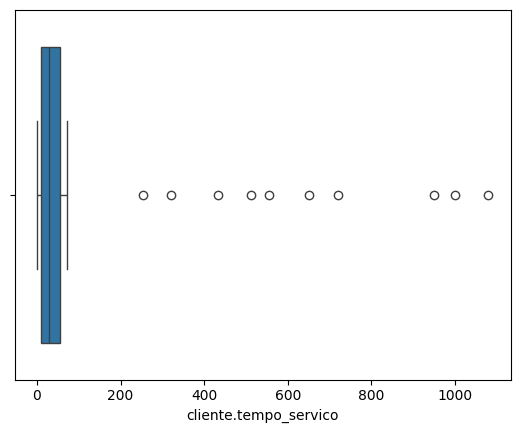

In [327]:
sns.boxplot(x=df_churn_sem_nulo['cliente.tempo_servico'])

In [328]:
Q1 = df_churn_sem_nulo['cliente.tempo_servico'].quantile(.25)
Q3 = df_churn_sem_nulo['cliente.tempo_servico'].quantile(.75)
IQR = Q3 - Q1
limite_inferior = Q1 - 1.5 * IQR
limite_superior = Q3 + 1.5 * IQR

In [329]:
outliers_index = (df_churn_sem_nulo['cliente.tempo_servico'] < limite_inferior) | (df_churn_sem_nulo['cliente.tempo_servico'] > limite_superior )
outliers_index

0       False
1       False
2       False
3       False
4       False
        ...  
7001    False
7002    False
7003    False
7004    False
7005    False
Name: cliente.tempo_servico, Length: 7006, dtype: bool

In [330]:
df_churn_sem_nulo[outliers_index]['cliente.tempo_servico']

1945    1080.0
1946    1000.0
1952     950.0
1956     254.0
1958     321.0
1963     650.0
1966     721.0
1970     555.0
1973     433.0
1974     512.0
Name: cliente.tempo_servico, dtype: float64

In [331]:
df_sem_out = df_churn_sem_nulo.copy()

In [332]:
df_sem_out[outliers_index]['cliente.tempo_servico']

1945    1080.0
1946    1000.0
1952     950.0
1956     254.0
1958     321.0
1963     650.0
1966     721.0
1970     555.0
1973     433.0
1974     512.0
Name: cliente.tempo_servico, dtype: float64

In [333]:
df_sem_out.loc[outliers_index,'cliente.tempo_servico'] = np.ceil(
    df_sem_out.loc[outliers_index,'conta.cobranca.Total'] /
    df_sem_out.loc[outliers_index,'conta.cobranca.mensal']
)

<Axes: xlabel='cliente.tempo_servico'>

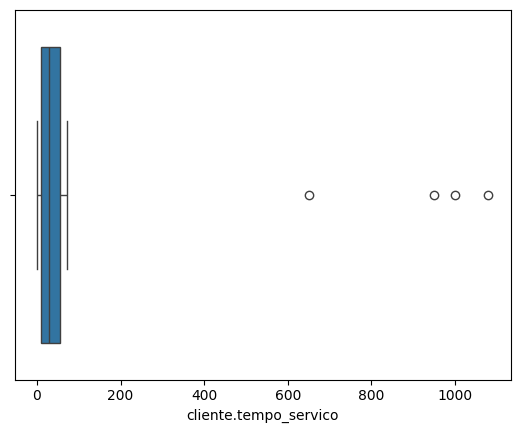

In [334]:
sns.boxplot(x=df_sem_out['cliente.tempo_servico'])

In [335]:
df_sem_out[outliers_index][['cliente.tempo_servico','conta.cobranca.Total','conta.cobranca.mensal']]

,cliente.tempo_servico,conta.cobranca.Total,conta.cobranca.mensal
1945,1080.0,112212.00,103.90
1946,1000.0,45900.00,45.90
1952,951.0,79895.00,84.10
1956,2.0,80.35,46.05
1958,43.0,4259.30,99.80
1963,650.0,47450.00,73.00
1966,44.0,3856.75,89.55
1970,7.0,124.40,19.15
1973,4.0,346.20,89.20
1974,1.0,19.55,19.55


### outras tecnicas de Outlier

Z-score

In [336]:
import numpy as np

# Dados de exemplo
data = np.array([10, 20, 30, 40, 150, 50, 60, 70, 80, 90, 100, 350])

# Cálculo do z-score
z_scores = (data - np.mean(data)) / np.std(data)

# Limite para considerar um dado como outlier
limite = 3

# Identificação dos outliers
outliers = data[np.abs(z_scores) > limite]

print("Outliers encontrados:", outliers)

Outliers encontrados: [350]


 Regra dos 3 sigmas

A regra dos 3 sigmas é uma técnica que utiliza a distribuição normal para identificar outliers. Ela diz que cerca de 99,7% dos dados estarão dentro de 3 desvios padrão da média. Portanto, se um dado estiver a mais de 3 desvios padrão da média, podemos considerá-lo como um outlier.

In [337]:
import numpy as np

# Criar um array com os dados
dados = np.array([0, 10, 12, 13, 15, 16, 18, 20, 22, 25, 30, 35, 40, 50, 350])

# Calcular a média e o desvio padrão do conjunto de dados
media = np.mean(dados)
desvio_padrao = np.std(dados)

# Definir o limite superior e inferior para identificar os outliers
limite_superior = media + (3 * desvio_padrao)
limite_inferior = media - (3 * desvio_padrao)

# Identificar os outliers no conjunto de dados
outliers = dados[(dados > limite_superior) | (dados < limite_inferior)]

print("Outliers:", outliers)

Outliers: [350]


Análise de dispersão

A análise de dispersão é uma técnica que utiliza gráficos para identificar outliers. Um gráfico comumente utilizado é o boxplot que mostra a distribuição dos dados em quartis. Os outliers são identificados como pontos fora dos limites superior e inferior do boxplot.

Outliers encontrados: []


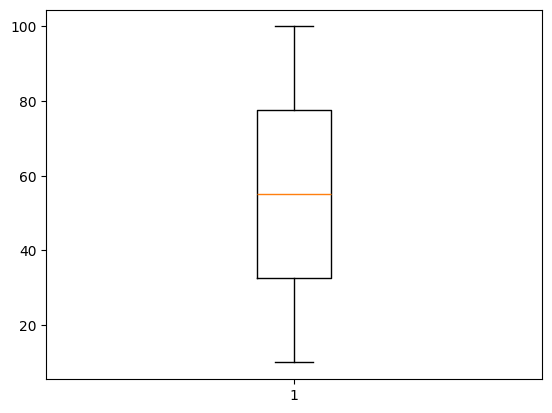

In [338]:
import matplotlib.pyplot as plt
import numpy as np

# Dados de exemplo
data = np.array([10, 20, 30, 40, 50, 60, 70, 80, 90, 100])

# Criação do boxplot
fig, ax = plt.subplots()
ax.boxplot(data)

# Identificação dos outliers
outliers = data[(data < np.percentile(data, 25) - (1.5 * (np.percentile(data, 75) - np.percentile(data, 25)))) |
                (data > np.percentile(data, 75) + (1.5 * (np.percentile(data, 75) - np.percentile(data, 25))))]

print("Outliers encontrados:", outliers)

In [339]:
df_sem_out[outliers_index]['cliente.tempo_servico']

1945    1080.0
1946    1000.0
1952     951.0
1956       2.0
1958      43.0
1963     650.0
1966      44.0
1970       7.0
1973       4.0
1974       1.0
Name: cliente.tempo_servico, dtype: float64

In [340]:
Q1 = df_sem_out['cliente.tempo_servico'].quantile(.25)
Q3 = df_sem_out['cliente.tempo_servico'].quantile(.75)
IQR = Q3 - Q1
limite_inferior = Q1 - 1.5 * IQR
limite_superior = Q3 + 1.5 * IQR

outliers_index = (df_sem_out['cliente.tempo_servico'] < limite_inferior) | (df_sem_out['cliente.tempo_servico'] > limite_superior )
outliers_index

0       False
1       False
2       False
3       False
4       False
        ...  
7001    False
7002    False
7003    False
7004    False
7005    False
Name: cliente.tempo_servico, Length: 7006, dtype: bool

In [341]:
df_sem_out[outliers_index]

,id_cliente,Churn,cliente.genero,cliente.idoso,cliente.parceiro,cliente.dependentes,cliente.tempo_servico,telefone.servico_telefone,telefone.varias_linhas,internet.servico_internet,...,internet.backup_online,internet.protecao_dispositivo,internet.suporte_tecnico,internet.tv_streaming,internet.filmes_streaming,conta.contrato,conta.faturamente_eletronico,conta.metodo_pagamento,conta.cobranca.mensal,conta.cobranca.Total
1945,2830-LEWOA,nao,masculino,0,sim,sim,1080.0,sim,nao,fibra otica,...,sim,sim,sim,sim,sim,um ano,nao,cartao de credito (automatico),103.9,112212.0
1946,2831-EBWRN,nao,masculino,0,nao,nao,1000.0,sim,nao,DSL,...,nao,nao,nao,nao,nao,mes a mes,sim,cheque eletronico,45.9,45900.0
1952,2834-SPCJV,sim,masculino,0,sim,nao,951.0,sim,nao,fibra otica,...,nao,nao,nao,sim,nao,mes a mes,nao,cheque eletronico,84.1,79895.0
1963,2851-STERV,nao,masculino,1,nao,nao,650.0,sim,nao,DSL,...,nao,sim,sim,sim,sim,um ano,sim,cheque eletronico,73.0,47450.0


In [342]:
df_sem_out = df_sem_out[~outliers_index]
df_sem_out

,id_cliente,Churn,cliente.genero,cliente.idoso,cliente.parceiro,cliente.dependentes,cliente.tempo_servico,telefone.servico_telefone,telefone.varias_linhas,internet.servico_internet,...,internet.backup_online,internet.protecao_dispositivo,internet.suporte_tecnico,internet.tv_streaming,internet.filmes_streaming,conta.contrato,conta.faturamente_eletronico,conta.metodo_pagamento,conta.cobranca.mensal,conta.cobranca.Total
0,0003-MKNFE,nao,masculino,0,nao,nao,9.0,sim,sim,DSL,...,nao,nao,nao,nao,sim,mes a mes,nao,cheque pelo correio,59.90,542.40
1,0004-TLHLJ,sim,masculino,0,nao,nao,4.0,sim,nao,fibra otica,...,nao,sim,nao,nao,nao,mes a mes,sim,cheque eletronico,73.90,280.85
2,0011-IGKFF,sim,masculino,1,sim,nao,13.0,sim,nao,fibra otica,...,sim,sim,nao,sim,sim,mes a mes,sim,cheque eletronico,98.00,1237.85
3,0013-EXCHZ,sim,feminino,1,sim,nao,3.0,sim,nao,fibra otica,...,nao,nao,sim,sim,nao,mes a mes,sim,cheque pelo correio,83.90,267.40
4,0013-MHZWF,nao,feminino,0,nao,sim,9.0,sim,nao,DSL,...,nao,nao,sim,sim,sim,mes a mes,sim,cartao de credito (automatico),69.40,571.45
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7001,9987-LUTYD,nao,feminino,0,nao,nao,13.0,sim,nao,DSL,...,nao,nao,sim,nao,nao,um ano,nao,cheque pelo correio,55.15,742.90
7002,9992-RRAMN,sim,masculino,0,sim,nao,22.0,sim,sim,fibra otica,...,nao,nao,nao,nao,sim,mes a mes,sim,cheque eletronico,85.10,1873.70
7003,9992-UJOEL,nao,masculino,0,nao,nao,2.0,sim,nao,DSL,...,sim,nao,nao,nao,nao,mes a mes,sim,cheque pelo correio,50.30,92.75
7004,9993-LHIEB,nao,masculino,0,sim,sim,67.0,sim,nao,DSL,...,nao,sim,sim,nao,sim,dois anos,nao,cheque pelo correio,67.85,4627.65


<Axes: xlabel='cliente.tempo_servico'>

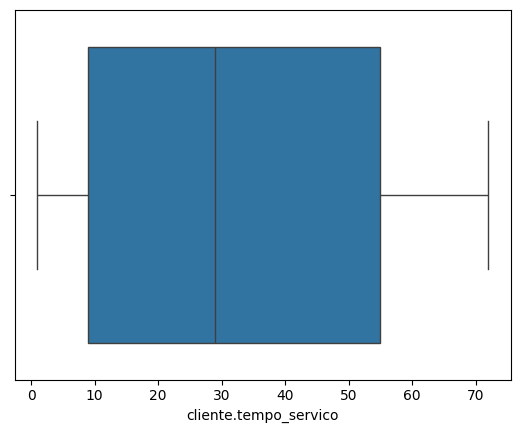

In [343]:
sns.boxplot(x=df_sem_out['cliente.tempo_servico'])

In [344]:
df_sem_out.reset_index(drop=True,inplace=True)

In [345]:
df_sem_out

,id_cliente,Churn,cliente.genero,cliente.idoso,cliente.parceiro,cliente.dependentes,cliente.tempo_servico,telefone.servico_telefone,telefone.varias_linhas,internet.servico_internet,...,internet.backup_online,internet.protecao_dispositivo,internet.suporte_tecnico,internet.tv_streaming,internet.filmes_streaming,conta.contrato,conta.faturamente_eletronico,conta.metodo_pagamento,conta.cobranca.mensal,conta.cobranca.Total
0,0003-MKNFE,nao,masculino,0,nao,nao,9.0,sim,sim,DSL,...,nao,nao,nao,nao,sim,mes a mes,nao,cheque pelo correio,59.90,542.40
1,0004-TLHLJ,sim,masculino,0,nao,nao,4.0,sim,nao,fibra otica,...,nao,sim,nao,nao,nao,mes a mes,sim,cheque eletronico,73.90,280.85
2,0011-IGKFF,sim,masculino,1,sim,nao,13.0,sim,nao,fibra otica,...,sim,sim,nao,sim,sim,mes a mes,sim,cheque eletronico,98.00,1237.85
3,0013-EXCHZ,sim,feminino,1,sim,nao,3.0,sim,nao,fibra otica,...,nao,nao,sim,sim,nao,mes a mes,sim,cheque pelo correio,83.90,267.40
4,0013-MHZWF,nao,feminino,0,nao,sim,9.0,sim,nao,DSL,...,nao,nao,sim,sim,sim,mes a mes,sim,cartao de credito (automatico),69.40,571.45
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6997,9987-LUTYD,nao,feminino,0,nao,nao,13.0,sim,nao,DSL,...,nao,nao,sim,nao,nao,um ano,nao,cheque pelo correio,55.15,742.90
6998,9992-RRAMN,sim,masculino,0,sim,nao,22.0,sim,sim,fibra otica,...,nao,nao,nao,nao,sim,mes a mes,sim,cheque eletronico,85.10,1873.70
6999,9992-UJOEL,nao,masculino,0,nao,nao,2.0,sim,nao,DSL,...,sim,nao,nao,nao,nao,mes a mes,sim,cheque pelo correio,50.30,92.75
7000,9993-LHIEB,nao,masculino,0,sim,sim,67.0,sim,nao,DSL,...,nao,sim,sim,nao,sim,dois anos,nao,cheque pelo correio,67.85,4627.65


In [346]:
df_sem_out.drop('id_cliente',axis= 1)

,Churn,cliente.genero,cliente.idoso,cliente.parceiro,cliente.dependentes,cliente.tempo_servico,telefone.servico_telefone,telefone.varias_linhas,internet.servico_internet,internet.seguranca_online,internet.backup_online,internet.protecao_dispositivo,internet.suporte_tecnico,internet.tv_streaming,internet.filmes_streaming,conta.contrato,conta.faturamente_eletronico,conta.metodo_pagamento,conta.cobranca.mensal,conta.cobranca.Total
0,nao,masculino,0,nao,nao,9.0,sim,sim,DSL,nao,nao,nao,nao,nao,sim,mes a mes,nao,cheque pelo correio,59.90,542.40
1,sim,masculino,0,nao,nao,4.0,sim,nao,fibra otica,nao,nao,sim,nao,nao,nao,mes a mes,sim,cheque eletronico,73.90,280.85
2,sim,masculino,1,sim,nao,13.0,sim,nao,fibra otica,nao,sim,sim,nao,sim,sim,mes a mes,sim,cheque eletronico,98.00,1237.85
3,sim,feminino,1,sim,nao,3.0,sim,nao,fibra otica,nao,nao,nao,sim,sim,nao,mes a mes,sim,cheque pelo correio,83.90,267.40
4,nao,feminino,0,nao,sim,9.0,sim,nao,DSL,nao,nao,nao,sim,sim,sim,mes a mes,sim,cartao de credito (automatico),69.40,571.45
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6997,nao,feminino,0,nao,nao,13.0,sim,nao,DSL,sim,nao,nao,sim,nao,nao,um ano,nao,cheque pelo correio,55.15,742.90
6998,sim,masculino,0,sim,nao,22.0,sim,sim,fibra otica,nao,nao,nao,nao,nao,sim,mes a mes,sim,cheque eletronico,85.10,1873.70
6999,nao,masculino,0,nao,nao,2.0,sim,nao,DSL,nao,sim,nao,nao,nao,nao,mes a mes,sim,cheque pelo correio,50.30,92.75
7000,nao,masculino,0,sim,sim,67.0,sim,nao,DSL,sim,nao,sim,sim,nao,sim,dois anos,nao,cheque pelo correio,67.85,4627.65


In [347]:
df_sem_id = df_sem_out.drop('id_cliente',axis= 1).copy()
df_sem_id

,Churn,cliente.genero,cliente.idoso,cliente.parceiro,cliente.dependentes,cliente.tempo_servico,telefone.servico_telefone,telefone.varias_linhas,internet.servico_internet,internet.seguranca_online,internet.backup_online,internet.protecao_dispositivo,internet.suporte_tecnico,internet.tv_streaming,internet.filmes_streaming,conta.contrato,conta.faturamente_eletronico,conta.metodo_pagamento,conta.cobranca.mensal,conta.cobranca.Total
0,nao,masculino,0,nao,nao,9.0,sim,sim,DSL,nao,nao,nao,nao,nao,sim,mes a mes,nao,cheque pelo correio,59.90,542.40
1,sim,masculino,0,nao,nao,4.0,sim,nao,fibra otica,nao,nao,sim,nao,nao,nao,mes a mes,sim,cheque eletronico,73.90,280.85
2,sim,masculino,1,sim,nao,13.0,sim,nao,fibra otica,nao,sim,sim,nao,sim,sim,mes a mes,sim,cheque eletronico,98.00,1237.85
3,sim,feminino,1,sim,nao,3.0,sim,nao,fibra otica,nao,nao,nao,sim,sim,nao,mes a mes,sim,cheque pelo correio,83.90,267.40
4,nao,feminino,0,nao,sim,9.0,sim,nao,DSL,nao,nao,nao,sim,sim,sim,mes a mes,sim,cartao de credito (automatico),69.40,571.45
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6997,nao,feminino,0,nao,nao,13.0,sim,nao,DSL,sim,nao,nao,sim,nao,nao,um ano,nao,cheque pelo correio,55.15,742.90
6998,sim,masculino,0,sim,nao,22.0,sim,sim,fibra otica,nao,nao,nao,nao,nao,sim,mes a mes,sim,cheque eletronico,85.10,1873.70
6999,nao,masculino,0,nao,nao,2.0,sim,nao,DSL,nao,sim,nao,nao,nao,nao,mes a mes,sim,cheque pelo correio,50.30,92.75
7000,nao,masculino,0,sim,sim,67.0,sim,nao,DSL,sim,nao,sim,sim,nao,sim,dois anos,nao,cheque pelo correio,67.85,4627.65


In [348]:
for col in df_sem_id.columns:
    print(f"Coluna: {col}")
    print(df_sem_id[col].unique())
    print("-" * 30)

Coluna: Churn
['nao' 'sim']
------------------------------
Coluna: cliente.genero
['masculino' 'feminino']
------------------------------
Coluna: cliente.idoso
[0 1]
------------------------------
Coluna: cliente.parceiro
['nao' 'sim']
------------------------------
Coluna: cliente.dependentes
['nao' 'sim']
------------------------------
Coluna: cliente.tempo_servico
[ 9.  4. 13.  3. 71. 63.  7. 66. 54. 72.  5. 56. 34.  1. 45. 50. 23. 55.
 26. 69. 37. 49. 67. 20. 43. 59. 12. 27.  2. 25. 29. 14. 35. 64. 39. 40.
 11.  6. 30. 70. 57. 58. 16. 32. 33. 10. 21. 61. 15. 44. 22. 24. 19. 47.
 62. 46. 52.  8. 60. 48. 28. 41. 53. 68. 31. 36. 17. 18. 65. 51. 38. 42.]
------------------------------
Coluna: telefone.servico_telefone
['sim' 'nao']
------------------------------
Coluna: telefone.varias_linhas
['sim' 'nao' 'sem servico de telefone']
------------------------------
Coluna: internet.servico_internet
['DSL' 'fibra otica' 'nao']
------------------------------
Coluna: internet.seguranca_onlin

In [349]:
print(df_sem_id.columns)

Index(['Churn', 'cliente.genero', 'cliente.idoso', 'cliente.parceiro',
       'cliente.dependentes', 'cliente.tempo_servico',
       'telefone.servico_telefone', 'telefone.varias_linhas',
       'internet.servico_internet', 'internet.seguranca_online',
       'internet.backup_online', 'internet.protecao_dispositivo',
       'internet.suporte_tecnico', 'internet.tv_streaming',
       'internet.filmes_streaming', 'conta.contrato',
       'conta.faturamente_eletronico', 'conta.metodo_pagamento',
       'conta.cobranca.mensal', 'conta.cobranca.Total'],
      dtype='object')


In [350]:
# Definindo o mapeamento
mapeamento = {
    'nao': 0,
    'sim': 1,
    'masculino': 0,
    'feminino': 1
}

# Listando as colunas que queremos alterar
colunas = ['telefone.servico_telefone', 'Churn', 'cliente.parceiro', 'cliente.dependentes', 'conta.faturamente_eletronico','cliente.genero']

# Substituindo os valores
df_sem_id[colunas] = df_sem_id[colunas].replace(mapeamento)

# Visualizando o resultado
print(df_sem_id)

      Churn  cliente.genero  cliente.idoso  cliente.parceiro  \
0         0               0              0                 0   
1         1               0              0                 0   
2         1               0              1                 1   
3         1               1              1                 1   
4         0               1              0                 0   
...     ...             ...            ...               ...   
6997      0               1              0                 0   
6998      1               0              0                 1   
6999      0               0              0                 0   
7000      0               0              0                 1   
7001      0               0              0                 1   

      cliente.dependentes  cliente.tempo_servico  telefone.servico_telefone  \
0                       0                    9.0                          1   
1                       0                    4.0                         

C:\Users\uilli\AppData\Local\Temp\ipykernel_15692\3311797239.py:13: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  df_sem_id[colunas] = df_sem_id[colunas].replace(mapeamento)


In [351]:
for col in df_sem_id.columns:
    print(f"Coluna: {col}")
    print(df_sem_id[col].unique())
    print("-" * 30)

Coluna: Churn
[0 1]
------------------------------
Coluna: cliente.genero
[0 1]
------------------------------
Coluna: cliente.idoso
[0 1]
------------------------------
Coluna: cliente.parceiro
[0 1]
------------------------------
Coluna: cliente.dependentes
[0 1]
------------------------------
Coluna: cliente.tempo_servico
[ 9.  4. 13.  3. 71. 63.  7. 66. 54. 72.  5. 56. 34.  1. 45. 50. 23. 55.
 26. 69. 37. 49. 67. 20. 43. 59. 12. 27.  2. 25. 29. 14. 35. 64. 39. 40.
 11.  6. 30. 70. 57. 58. 16. 32. 33. 10. 21. 61. 15. 44. 22. 24. 19. 47.
 62. 46. 52.  8. 60. 48. 28. 41. 53. 68. 31. 36. 17. 18. 65. 51. 38. 42.]
------------------------------
Coluna: telefone.servico_telefone
[1 0]
------------------------------
Coluna: telefone.varias_linhas
['sim' 'nao' 'sem servico de telefone']
------------------------------
Coluna: internet.servico_internet
['DSL' 'fibra otica' 'nao']
------------------------------
Coluna: internet.seguranca_online
['nao' 'sim' 'sem servico de internet']
---------

# Tipos de Variáveis Categóricas

## 1. Variáveis Categóricas Binárias
Essas variáveis têm apenas duas categorias possíveis. Exemplos:
- **Gênero**: Masculino ou Feminino.
- **Churn**: Sim ou Não (se o cliente cancelou ou não o serviço).

## 2. Variáveis Categóricas Não Binárias
Essas variáveis têm mais de duas categorias. Exemplos:
- **Cor**: Vermelho, Azul, Verde, Amarelo.
- **Tipo de Contrato**: Mensal, Anual, Bienal.

## 3. Variáveis Categóricas Ordinais
Essas variáveis têm categorias que possuem uma ordem ou hierarquia. Exemplos:
- **Nível de Satisfação**: Muito Insatisfeito, Insatisfeito, Neutro, Satisfeito, Muito Satisfeito.
- **Classificação de um Produto**: 1 estrela, 2 estrelas, 3 estrelas, 4 estrelas, 5 estrelas.

### Tecnica de Dummys

In [352]:
df_sem_id.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7002 entries, 0 to 7001
Data columns (total 20 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   Churn                          7002 non-null   int64  
 1   cliente.genero                 7002 non-null   int64  
 2   cliente.idoso                  7002 non-null   int64  
 3   cliente.parceiro               7002 non-null   int64  
 4   cliente.dependentes            7002 non-null   int64  
 5   cliente.tempo_servico          7002 non-null   float64
 6   telefone.servico_telefone      7002 non-null   int64  
 7   telefone.varias_linhas         7002 non-null   object 
 8   internet.servico_internet      7002 non-null   object 
 9   internet.seguranca_online      7002 non-null   object 
 10  internet.backup_online         7002 non-null   object 
 11  internet.protecao_dispositivo  7002 non-null   object 
 12  internet.suporte_tecnico       7002 non-null   o

In [353]:
pd.get_dummies(df_sem_id)

,Churn,cliente.genero,cliente.idoso,cliente.parceiro,cliente.dependentes,cliente.tempo_servico,telefone.servico_telefone,conta.faturamente_eletronico,conta.cobranca.mensal,conta.cobranca.Total,...,internet.filmes_streaming_nao,internet.filmes_streaming_sem servico de internet,internet.filmes_streaming_sim,conta.contrato_dois anos,conta.contrato_mes a mes,conta.contrato_um ano,conta.metodo_pagamento_cartao de credito (automatico),conta.metodo_pagamento_cheque eletronico,conta.metodo_pagamento_cheque pelo correio,conta.metodo_pagamento_transferencia bancaria (automatica)
0,0,0,0,0,0,9.0,1,0,59.90,542.40,...,False,False,True,False,True,False,False,False,True,False
1,1,0,0,0,0,4.0,1,1,73.90,280.85,...,True,False,False,False,True,False,False,True,False,False
2,1,0,1,1,0,13.0,1,1,98.00,1237.85,...,False,False,True,False,True,False,False,True,False,False
3,1,1,1,1,0,3.0,1,1,83.90,267.40,...,True,False,False,False,True,False,False,False,True,False
4,0,1,0,0,1,9.0,1,1,69.40,571.45,...,False,False,True,False,True,False,True,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6997,0,1,0,0,0,13.0,1,0,55.15,742.90,...,True,False,False,False,False,True,False,False,True,False
6998,1,0,0,1,0,22.0,1,1,85.10,1873.70,...,False,False,True,False,True,False,False,True,False,False
6999,0,0,0,0,0,2.0,1,1,50.30,92.75,...,True,False,False,False,True,False,False,False,True,False
7000,0,0,0,1,1,67.0,1,0,67.85,4627.65,...,False,False,True,True,False,False,False,False,True,False


In [354]:
df = pd.get_dummies(df_sem_id , dtype= int).copy()

In [355]:
df.columns

Index(['Churn', 'cliente.genero', 'cliente.idoso', 'cliente.parceiro',
       'cliente.dependentes', 'cliente.tempo_servico',
       'telefone.servico_telefone', 'conta.faturamente_eletronico',
       'conta.cobranca.mensal', 'conta.cobranca.Total',
       'telefone.varias_linhas_nao',
       'telefone.varias_linhas_sem servico de telefone',
       'telefone.varias_linhas_sim', 'internet.servico_internet_DSL',
       'internet.servico_internet_fibra otica',
       'internet.servico_internet_nao', 'internet.seguranca_online_nao',
       'internet.seguranca_online_sem servico de internet',
       'internet.seguranca_online_sim', 'internet.backup_online_nao',
       'internet.backup_online_sem servico de internet',
       'internet.backup_online_sim', 'internet.protecao_dispositivo_nao',
       'internet.protecao_dispositivo_sem servico de internet',
       'internet.protecao_dispositivo_sim', 'internet.suporte_tecnico_nao',
       'internet.suporte_tecnico_sem servico de internet',
     

In [356]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7002 entries, 0 to 7001
Data columns (total 41 columns):
 #   Column                                                      Non-Null Count  Dtype  
---  ------                                                      --------------  -----  
 0   Churn                                                       7002 non-null   int64  
 1   cliente.genero                                              7002 non-null   int64  
 2   cliente.idoso                                               7002 non-null   int64  
 3   cliente.parceiro                                            7002 non-null   int64  
 4   cliente.dependentes                                         7002 non-null   int64  
 5   cliente.tempo_servico                                       7002 non-null   float64
 6   telefone.servico_telefone                                   7002 non-null   int64  
 7   conta.faturamente_eletronico                                7002 non-null   int64  
 8 

## Analise Exploratoria

<Axes: title={'center': 'Distribuição do Churn'}, xlabel='Churn'>

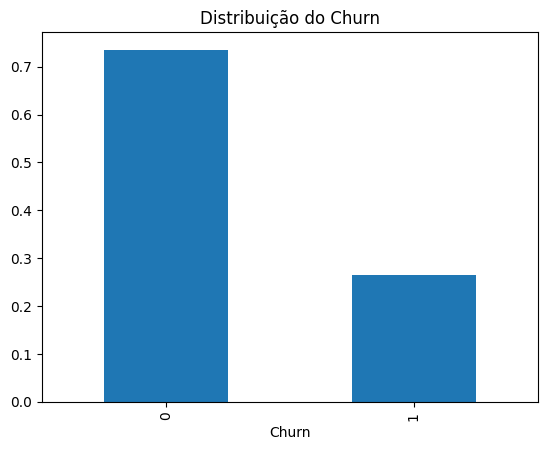

In [357]:
df['Churn'].value_counts(normalize=True).plot(kind='bar', title='Distribuição do Churn')


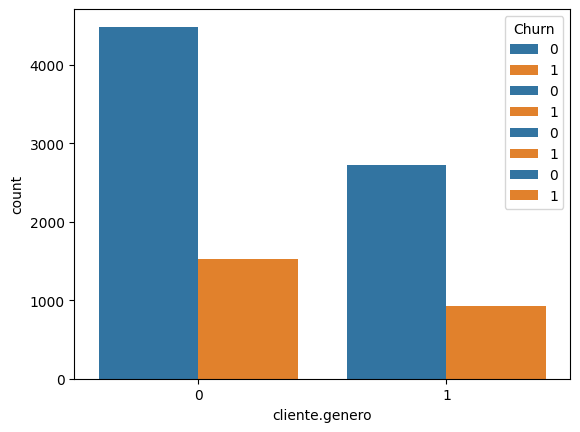

In [358]:
cat_vars = ['cliente.genero', 'cliente.parceiro', 'cliente.dependentes', 'cliente.idoso']
for var in cat_vars:
    sns.countplot(x=var, hue='Churn', data=df)


<Axes: xlabel='Churn', ylabel='conta.cobranca.mensal'>

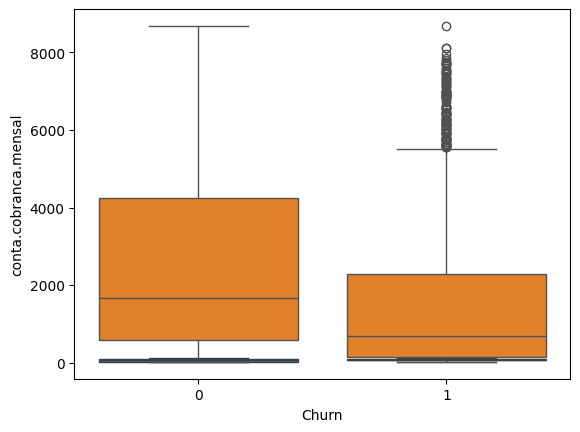

In [359]:
sns.boxplot(x='Churn', y='conta.cobranca.mensal', data=df)
sns.boxplot(x='Churn', y='conta.cobranca.Total', data=df)


<Axes: xlabel='cliente.tempo_servico', ylabel='Count'>

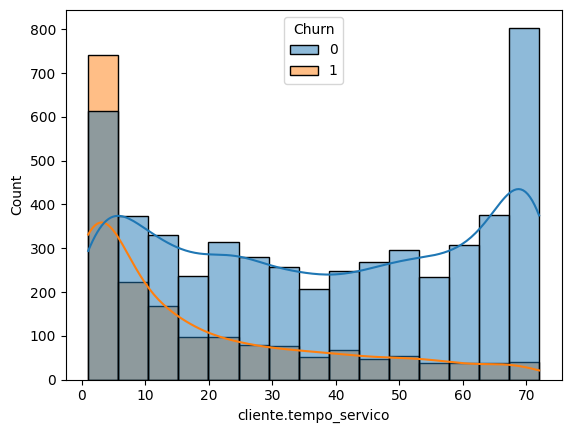

In [360]:
sns.histplot(data=df, x='cliente.tempo_servico', hue='Churn', kde=True)


## Desenvolvomento dos modelos. 

### Random Florest

In [361]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score


In [362]:
X = df.drop(columns=['Churn'])  
y = df['Churn']



Divide teste e Treino 70/20

In [363]:
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, stratify=y, random_state=42
)


Treinando modelo usando Randon Forest

In [364]:
rf = RandomForestClassifier(n_estimators=100, random_state=42)
rf.fit(X_train, y_train)


RandomForestClassifier(random_state=42)

Avaliação do modelo

Acurácia: 0.7816
Sensibilidade (Recall Positivo): 0.5067
Especificidade (Recall Negativo): 0.8806


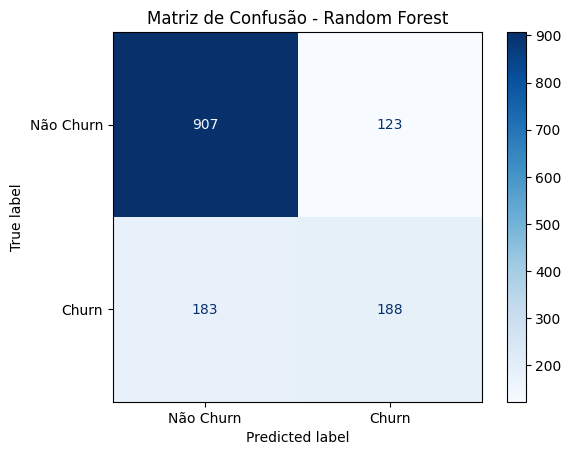

In [365]:
from sklearn.metrics import confusion_matrix, accuracy_score, ConfusionMatrixDisplay

import matplotlib.pyplot as plt
# Fazer previsões
y_pred = rf.predict(X_test)

# Gerar matriz de confusão
cm = confusion_matrix(y_test, y_pred)

# Extrair TP, TN, FP, FN
tn, fp, fn, tp = cm.ravel()

# Calcular métricas
acuracia = accuracy_score(y_test, y_pred)
sensibilidade = tp / (tp + fn)  # Recall da classe positiva (churn)
especificidade = tn / (tn + fp)  # Recall da classe negativa (não churn)

# Mostrar resultados
print(f"Acurácia: {acuracia:.4f}")
print(f"Sensibilidade (Recall Positivo): {sensibilidade:.4f}")
print(f"Especificidade (Recall Negativo): {especificidade:.4f}")

# Plotar matriz de confusão
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=['Não Churn', 'Churn'])
disp.plot(cmap='Blues')
plt.title("Matriz de Confusão - Random Forest")
plt.show()

Importancia das Feactures

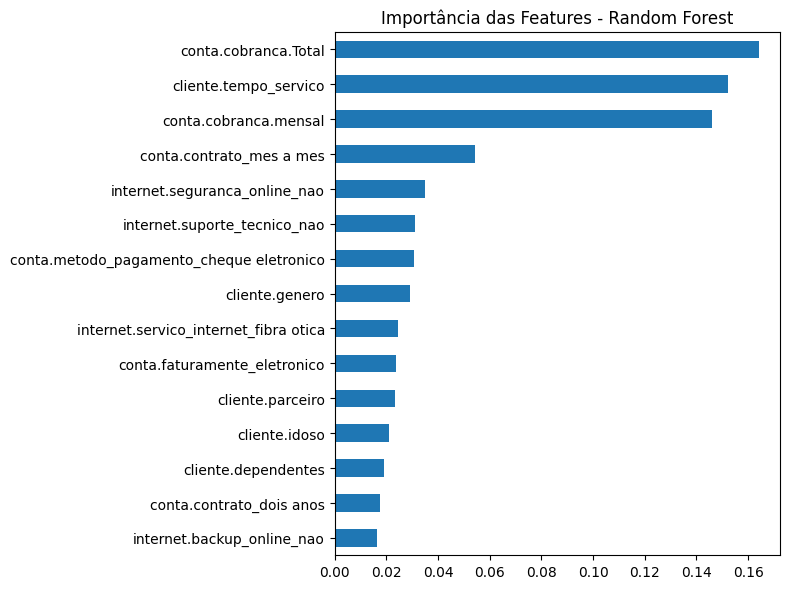

In [366]:

importances = pd.Series(rf.feature_importances_, index=X.columns)
importances.nlargest(15).sort_values().plot(kind='barh', figsize=(8,6))
plt.title("Importância das Features - Random Forest")
plt.tight_layout()
plt.show()


## 📈 Comparativo de Modelos: Árvore de Decisão vs Random Forest

| Métrica                        | 🌳 Árvore de Decisão | 🌲 Random Forest |
|-------------------------------|----------------------|------------------|
| **Acurácia**                  | 78,44%               | 78,16%           |
| **Sensibilidade (Recall 1)**  | 47,71%               | 50,67%           |
| **Especificidade (Recall 0)** | 89,51%               | 88,06%           |

---

### 🧠 Interpretação:

- O **Random Forest tem uma sensibilidade levemente superior**, ou seja, identifica um pouco melhor os clientes que vão dar churn.
- Já a **Árvore de Decisão tem uma especificidade ligeiramente maior**, sendo mais conservadora e acertando melhor os clientes que vão permanecer.

### 🎯 Recomendação:

- Se seu foco for **reduzir perdas e capturar mais churns**, prefira o **Random Forest**, que está identificando melhor os churns.
- Se seu foco for **evitar falsos alarmes (clientes que não vão churnar sendo tratados como se fossem)**, a **Árvore de Decisão** pode ser mais interessante.
- Para melhorar o desempenho, você pode testar:
  - Balanceamento de classes (como `SMOTE` ou `class_weight='balanced'`)
  - Ajustar o threshold de classificação
  - Testar outros modelos como **XGBoost** ou **LightGBM**



### Arvore de Decisão

Acurácia: 0.7844
Sensibilidade (Recall Positivo): 0.4771
Especificidade (Recall Negativo): 0.8951

Relatório de Classificação:

              precision    recall  f1-score   support

           0       0.83      0.90      0.86      1030
           1       0.62      0.48      0.54       371

    accuracy                           0.78      1401
   macro avg       0.72      0.69      0.70      1401
weighted avg       0.77      0.78      0.77      1401



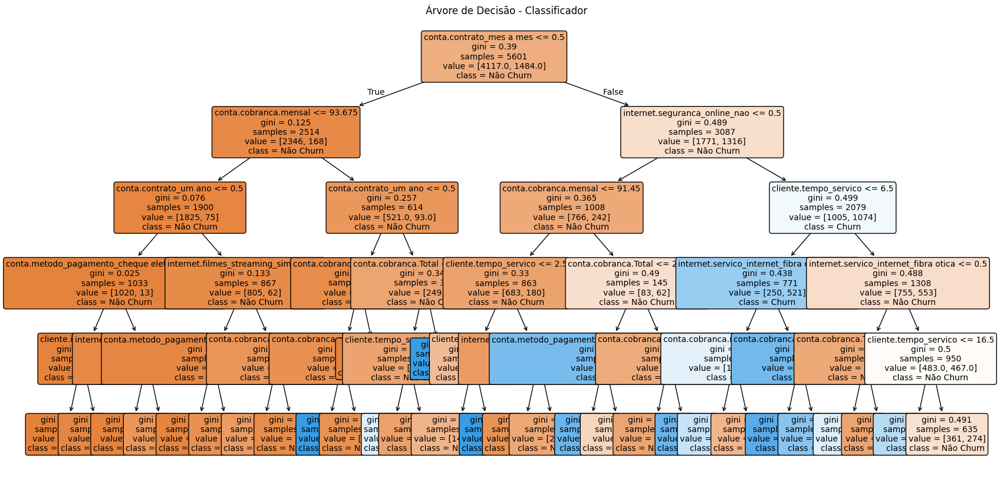

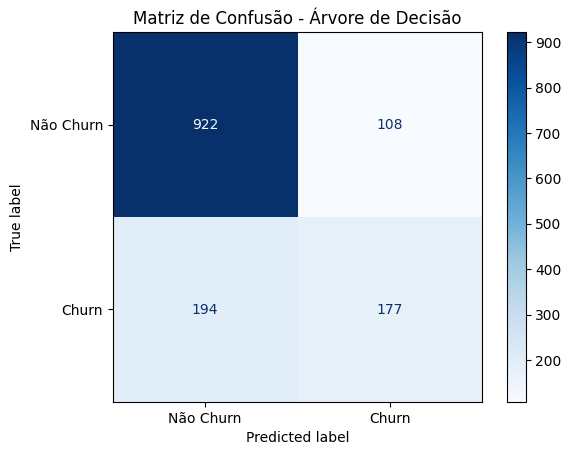

In [367]:
from sklearn.tree import DecisionTreeClassifier, plot_tree
from sklearn.metrics import (
    confusion_matrix, accuracy_score,
    ConfusionMatrixDisplay, classification_report
)


# Treinar a árvore de decisão
arvore = DecisionTreeClassifier(max_depth=5, random_state=42)
arvore.fit(X_train, y_train)

# Prever no conjunto de teste
y_pred = arvore.predict(X_test)

# Matriz de confusão
cm = confusion_matrix(y_test, y_pred)
tn, fp, fn, tp = cm.ravel()

# Métricas
acuracia = accuracy_score(y_test, y_pred)
sensibilidade = tp / (tp + fn)
especificidade = tn / (tn + fp)

print(f"Acurácia: {acuracia:.4f}")
print(f"Sensibilidade (Recall Positivo): {sensibilidade:.4f}")
print(f"Especificidade (Recall Negativo): {especificidade:.4f}")
print("\nRelatório de Classificação:\n")
print(classification_report(y_test, y_pred))

# Plot da árvore de decisão
plt.figure(figsize=(20, 10))
plot_tree(
    arvore,
    feature_names=X.columns,
    class_names=['Não Churn', 'Churn'],
    filled=True,
    rounded=True,
    fontsize=10
)
plt.title("Árvore de Decisão - Classificador")
plt.show()

# Plot da matriz de confusão
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=['Não Churn', 'Churn'])
disp.plot(cmap='Blues')
plt.title("Matriz de Confusão - Árvore de Decisão")
plt.show()


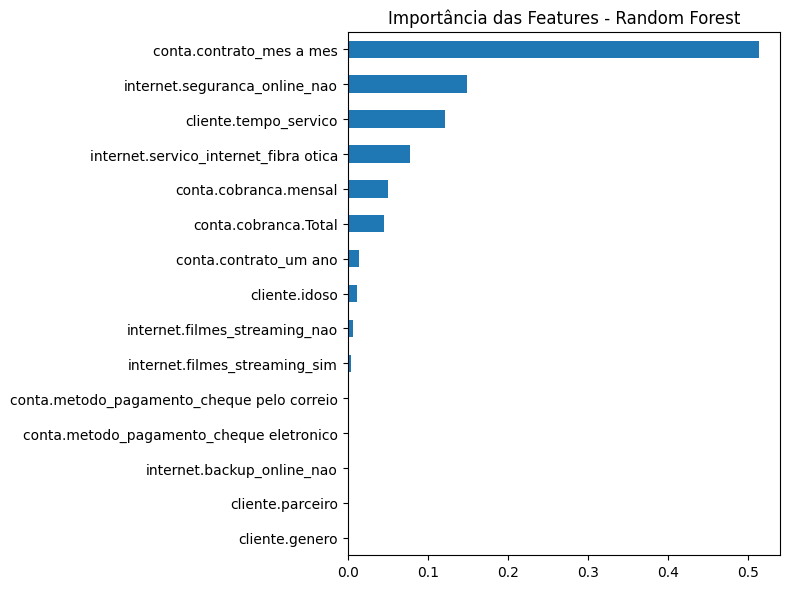

In [371]:

importances = pd.Series(arvore.feature_importances_, index=X.columns)
importances.nlargest(15).sort_values().plot(kind='barh', figsize=(8,6))
plt.title("Importância das Features - Random Forest")
plt.tight_layout()
plt.show()

## 🌳 Modelo: Árvore de Decisão

**Métricas Gerais:**
- **Acurácia**: 78,44%
- **Sensibilidade (Recall Positivo)**: 47,71%
- **Especificidade (Recall Negativo)**: 89,51%

---

**Relatório de Classificação:**

| Classe        | Precisão | Recall | F1-Score | Suporte |
|---------------|----------|--------|----------|---------|
| **0 (Não Churn)** | 0.83     | 0.90   | 0.86     | 1030    |
| **1 (Churn)**     | 0.62     | 0.48   | 0.54     | 371     |

- **Acurácia Geral**: 0.7844  
- **Média Macro**: F1 = 0.70  
- **Média Ponderada**: F1 = 0.77

---

**Interpretação:**
- O modelo é **muito bom em identificar quem NÃO vai dar churn** (especificidade alta: 89,51%).
- Porém, ele tem **dificuldade em identificar corretamente quem vai dar churn** (sensibilidade de apenas 47,71%).
- Pode ser necessário ajustar o **balanceamento das classes**, usar **pesos ou técnicas de oversampling** como SMOTE se o foco for capturar mais casos positivos.



In [368]:
# Se ainda não tiver, define X e y no dataset completo
X = df.drop(columns=['id_cliente', 'Churn', 'churn_random_forest', 'churn_arvore_decisao'], errors='ignore')
y = df['Churn']if df['Churn'].dtype == 'object' else df['Churn']

# Previsões dos modelos
df['churn_random_forest'] = rf.predict(X)
df['churn_arvore_decisao'] = arvore.predict(X)

# Resíduos: real - previsto
df['residuo_random_forest'] = y - df['churn_random_forest']
df['residuo_arvore_decisao'] = y - df['churn_arvore_decisao']

# (Opcional) Converter previsões de volta pra "sim"/"não" se preferir texto
df['churn_random_forest'] = df['churn_random_forest']
df['churn_arvore_decisao'] = df['churn_arvore_decisao']
df.head()


,Churn,cliente.genero,cliente.idoso,cliente.parceiro,cliente.dependentes,cliente.tempo_servico,telefone.servico_telefone,conta.faturamente_eletronico,conta.cobranca.mensal,conta.cobranca.Total,...,conta.contrato_mes a mes,conta.contrato_um ano,conta.metodo_pagamento_cartao de credito (automatico),conta.metodo_pagamento_cheque eletronico,conta.metodo_pagamento_cheque pelo correio,conta.metodo_pagamento_transferencia bancaria (automatica),churn_random_forest,churn_arvore_decisao,residuo_random_forest,residuo_arvore_decisao
0,0,0,0,0,0,9.0,1,0,59.9,542.40,...,1,0,0,0,1,0,0,0,0,0
1,1,0,0,0,0,4.0,1,1,73.9,280.85,...,1,0,0,1,0,0,1,1,0,0
2,1,0,1,1,0,13.0,1,1,98.0,1237.85,...,1,0,0,1,0,0,1,1,0,0
3,1,1,1,1,0,3.0,1,1,83.9,267.40,...,1,0,0,0,1,0,1,1,0,0
4,0,1,0,0,1,9.0,1,1,69.4,571.45,...,1,0,1,0,0,0,0,0,0,0


In [369]:
# Converter y real se ainda não tiver
y = df['Churn'] if df['Churn'].dtype == 'object' else df['Churn']

# Reconstruir as previsões como numéricas
y_pred_rf = df['churn_random_forest']
y_pred_arv = df['churn_arvore_decisao']

# Calcular resíduos
residuo_rf = y - y_pred_rf
residuo_arv = y - y_pred_arv

# Percentual de erro (resíduos ≠ 0)
erro_rf = (residuo_rf != 0).mean() * 100
erro_arv = (residuo_arv != 0).mean() * 100

# Também podemos mostrar a porcentagem de acerto
acerto_rf = 100 - erro_rf
acerto_arv = 100 - erro_arv

print(f"🔍 Random Forest - Erro: {erro_rf:.2f}% | Acerto: {acerto_rf:.2f}%")
print(f"🌳 Árvore de Decisão - Erro: {erro_arv:.2f}% | Acerto: {acerto_arv:.2f}%")


🔍 Random Forest - Erro: 4.54% | Acerto: 95.46%
🌳 Árvore de Decisão - Erro: 19.69% | Acerto: 80.31%


In [370]:
df.head()

,Churn,cliente.genero,cliente.idoso,cliente.parceiro,cliente.dependentes,cliente.tempo_servico,telefone.servico_telefone,conta.faturamente_eletronico,conta.cobranca.mensal,conta.cobranca.Total,...,conta.contrato_mes a mes,conta.contrato_um ano,conta.metodo_pagamento_cartao de credito (automatico),conta.metodo_pagamento_cheque eletronico,conta.metodo_pagamento_cheque pelo correio,conta.metodo_pagamento_transferencia bancaria (automatica),churn_random_forest,churn_arvore_decisao,residuo_random_forest,residuo_arvore_decisao
0,0,0,0,0,0,9.0,1,0,59.9,542.40,...,1,0,0,0,1,0,0,0,0,0
1,1,0,0,0,0,4.0,1,1,73.9,280.85,...,1,0,0,1,0,0,1,1,0,0
2,1,0,1,1,0,13.0,1,1,98.0,1237.85,...,1,0,0,1,0,0,1,1,0,0
3,1,1,1,1,0,3.0,1,1,83.9,267.40,...,1,0,0,0,1,0,1,1,0,0
4,0,1,0,0,1,9.0,1,1,69.4,571.45,...,1,0,1,0,0,0,0,0,0,0


C:\Users\uilli\AppData\Local\Temp\ipykernel_15692\794583679.py:29: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) Arial.
  plt.tight_layout()
C:\Users\uilli\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) Arial.
  fig.canvas.print_figure(bytes_io, **kw)


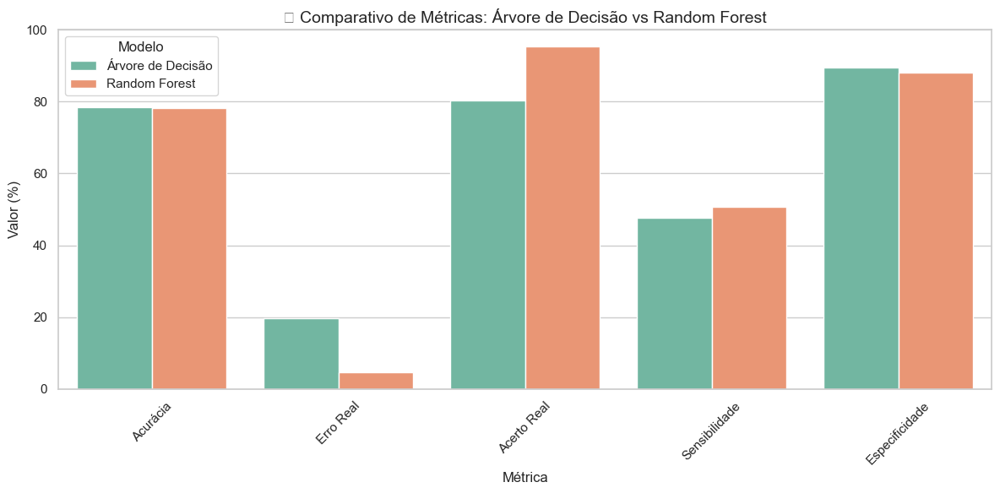

In [372]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# Dados de comparação
metricas = ['Acurácia', 'Erro Real', 'Acerto Real', 'Sensibilidade', 'Especificidade']
arvore_decisao = [78.44, 19.69, 80.31, 47.71, 89.51]
random_forest = [78.16, 4.54, 95.46, 50.67, 88.06]

# DataFrame para plotagem
df_metricas = pd.DataFrame({
    'Métrica': metricas,
    'Árvore de Decisão': arvore_decisao,
    'Random Forest': random_forest
})

# Configurações do gráfico
plt.figure(figsize=(12, 6))
sns.set(style="whitegrid")
barplot = sns.barplot(data=df_metricas.melt(id_vars='Métrica', var_name='Modelo', value_name='Valor'),
                      x='Métrica', y='Valor', hue='Modelo', palette='Set2')

# Ajustes finais
plt.title('📊 Comparativo de Métricas: Árvore de Decisão vs Random Forest', fontsize=14)
plt.ylabel('Valor (%)')
plt.ylim(0, 100)
plt.xticks(rotation=45)
plt.legend(title='Modelo')
plt.tight_layout()
plt.show()


## 📈 Comparativo de Modelos: Árvore de Decisão vs Random Forest

| Métrica                        | 🌳 Árvore de Decisão | 🌲 Random Forest |
|-------------------------------|----------------------|------------------|
| **Acurácia (Relatório)**      | 78,44%               | 78,16%           |
| **Erro Real (Resíduo)**       | 19,69%               | 4,54%            |
| **Acerto Real (Resíduo)**     | 80,31%               | 95,46%           |
| **Sensibilidade (Recall 1)**  | 47,71%               | 50,67%           |
| **Especificidade (Recall 0)** | 89,51%               | 88,06%           |

---

### 🧠 Interpretação:

- O **Random Forest** não só tem uma leve vantagem em **sensibilidade**, como também apresenta um **acerto real muito superior**: 95,46% vs 80,31%.
- A **Árvore de Decisão**, apesar de uma boa especificidade, está cometendo muito mais erros globais.
- Isso indica que o Random Forest está **mais robusto** e **geralmente mais confiável** para prever corretamente o churn.

### 🎯 Recomendação Final:

> Para este cenário, o **Random Forest é claramente o modelo preferido**, pois entrega maior acurácia efetiva, sensibilidade e um erro real muito menor.



## 📊 Métricas de Avaliação em Modelos de Churn

Quando estamos prevendo **churn** (cancelamento de clientes), é essencial entender o papel de cada métrica de avaliação. Abaixo, detalhamos as principais métricas usadas e o que você **ganha e perde** ao focar em cada uma delas.

---

### ✅ Acurácia
**Fórmula**: `(TP + TN) / (TP + TN + FP + FN)`

- **O que mede:** Proporção de previsões corretas no total.
- **Quando usar:** Útil para uma visão geral da performance.
  
#### ✔️ Vantagens:
- Fácil de interpretar.
- Resume a performance geral do modelo.

#### ❌ Desvantagens:
- Pode ser **enganosa em datasets desbalanceados** (ex: maioria dos clientes não churna).
- Um modelo pode ter alta acurácia **sem detectar churns reais**.

---

### 🔍 Sensibilidade (Recall Positivo)
**Fórmula**: `TP / (TP + FN)`

- **O que mede:** Proporção de churns reais que o modelo acertou.
- **Quando usar:** Quando o **custo de perder um cliente é alto** e ações proativas são prioridade.

#### ✔️ Vantagens:
- Foca em **não perder churns reais**.
- Ajuda a agir antes que o cliente saia.

#### ❌ Desvantagens:
- Pode gerar **muitos falsos positivos** (clientes marcados como churn sem ser).
- Reduz precisão se usada isoladamente.

---

### 🛡️ Especificidade (Recall Negativo)
**Fórmula**: `TN / (TN + FP)`

- **O que mede:** Proporção de clientes que não churnam e foram corretamente classificados.
- **Quando usar:** Quando o foco é **evitar esforços desnecessários** com quem já ia ficar.

#### ✔️ Vantagens:
- Reduz custo com ações de retenção mal direcionadas.
- Mantém a **eficiência operacional**.

#### ❌ Desvantagens:
- Pode deixar churns passarem despercebidos.
- Sacrifica sensibilidade se priorizada demais.

---

### 🎯 Qual escolher?

Depende do seu objetivo de negócio:

- 🔥 **Minimizar perda de clientes?**  
  → Priorize **sensibilidade** (mesmo com mais falsos positivos).

- 💸 **Evitar desperdício em campanhas de retenção?**  
  → Priorize **especificidade**.

- ⚖️ **Buscar equilíbrio entre os dois?**  
  → Use o **F1-Score**, que combina precisão e recall.

---
